In [1]:
using Plots
using LaTeXStrings
using LinearAlgebra
using FFTW
using BenchmarkTools
using Distributions
using Unwrap
using JuMP
using Ipopt

In [2]:
function fftnshift(A::AbstractArray)
    B = copy(A)
    return fftshift(fft(B))
end
function ifftnshift(A::AbstractArray)
    B = copy(A)
    return ifft(ifftshift(B))
end

ifftnshift (generic function with 1 method)

In [3]:
function Pixelate_Reciprocal(image, camera_scale, physical_scale)
    # This function pixelates the image in the reciprocal space
    # It is assumed that the image is already in the reciprocal space and normally ordered
    # the averaging kernel is Fourier transform where the scaling ratio its size

    Ny, Nx = size(image)
    N = Nx
    scaling_ratio = round(Int, camera_scale/physical_scale)

    Nx_camera = Nx ÷ scaling_ratio
    Ny_camera = Ny ÷ scaling_ratio
    N_camera = Nx_camera
    

    upper = (N-1)/2 
    lower = (-N+1)/2
    kx = @. (lower:1.0:upper) * 1/(physical_scale*N )
    ky = @. (lower:1.0:upper) * 1/(physical_scale*N )

    prod = @. sinc(kx * scaling_ratio)
    FT_kernel = prod * prod'
    image_lowpass = @. FT_kernel .* image
    
    
    slct_low = (N-N_camera)÷2 + 1
    slct_high = slct_low + N_camera - 1
    kx_pixelated = kx[slct_low:slct_high]
    ky_pixelated = ky[slct_low:slct_high]
    
    image_pixelated = image_lowpass[slct_low:slct_high, slct_low:slct_high]
    image_pixelated = @. image_pixelated/ scaling_ratio^2
    return image_pixelated, kx_pixelated, ky_pixelated
end

Pixelate_Reciprocal (generic function with 1 method)

In [4]:


function Noisy_Image(A::AbstractMatrix{<:Number}, N_electrons::T ,
            background_noise::U, kspace=false) where {T<:Real,U<:Real}


    image = copy(A)
    if kspace
        # image is assumed to be in reciprocal space and normally ordered
        image = ifftnshift(image)
    end
    image = abs.(image) # image is assumed to be in real-space and real

    
    image_normalized = N_electrons .* image./sum(image)
    background_noise = rand(Poisson(background_noise), size(image))
    image_poisson =  rand.(Poisson.(image_normalized))
    image_noisy = image_poisson .+ background_noise

    if kspace
        image_noisy = fftnshift(image_noisy)
        return image_noisy
    end

    return image_noisy
end



Noisy_Image (generic function with 2 methods)

In [5]:
function Diff_Image(image, c)
    return @. log1p(c*abs(image))
end

Diff_Image (generic function with 1 method)

In [6]:
function Wavelength(E)
    hc = 12.398 #keV*Angstrom
    # h = 6.582119e-16 #eV*sec
    # mc2 = 511 #keV
    E₀ = 511 #keV
    return hc/sqrt(E*(2*E₀ + E))
end

function Focus(E, Cs, nᵢ=1)
    return sqrt((2*nᵢ-0.5)*Cs*Wavelength(E))
end
kmax(E, Cs) = (6/((Cs*Wavelength(E)^3)))^(1/4)

function TEM_Image(wf_transmission, E, Cs)
    Ny, Nx = size(wf_transmission)
    if Nx != Ny
        error("Image must be square")
    elseif 2^(floor(Int, log2(Nx))) != Nx
        error("Image must be power of 2")
    end
    N = Nx

    upper = (N-1)/2 + 0.1
    lower = (-N+1)/2
    kx = lower:1.0:upper
    ky = lower:1.0:upper

    k = @. sqrt(kx'^2 + ky^2)
    disk = k.<=N/2

    λ = Wavelength(E)
    Δf = Focus(E, Cs)
    Hₒ = @. exp(-1im*(π*λ*k^2*(0.5*Cs*λ^2*k^2 - Δf)))*disk
    
    fft_ideal_image = fftnshift(wf_transmission)
    fft_physical_image = fft_ideal_image.*Hₒ
    image_physical = ifftnshift(fft_physical_image)
    
    return image_physical
end

TEM_Image (generic function with 1 method)

In [7]:
E = 300
Cs = 1 #mm
Cs = Cs * 1e7 #convert to Angstroms

N = 2^8
physical_scale = 1
camera_scale = 2

upper = (N-1)/2 + 0.1
lower = (-N+1)/2
kx = lower:1:upper
ky = lower:1:upper

k = @. sqrt(kx'^2 + ky^2)
disk = k.<=N/2

kx = kx./maximum(kx).*kmax(E, Cs)
ky = ky./maximum(ky).*kmax(E, Cs)
k = @. sqrt(kx'^2 + ky^2)

L = 1/(kx[2]-kx[1])
ΔL = L/N

x = LinRange(-L/2, L/2, N)
y = LinRange(-L/2, L/2, N)

λ(E) = Wavelength(E)
Δf(E, Cs) = Focus(E, Cs)

H = @. exp(-1im*(π*λ(E)*k^2*(0.5*Cs*λ(E)^2*k^2 - Δf(E, Cs)))*disk)*disk
f(x, y, xc, yc, σ₁, σ₂) = @. (1/((2*pi)*sqrt(σ₁*σ₂)))*exp(-(x - xc)^2/(2σ₁^2) -(y - yc)^2/(2σ₂^2) )
heatmap(kx, ky, angle.(H), title="angle of the tansfer function H",  
        xlabel=L"k_x\, Å^{-1}", ylabel=L"k_y\, Å^{-1}", aspect_ratio=1)
xlims!(kx[1], kx[end])
ylims!(ky[1], ky[end]);

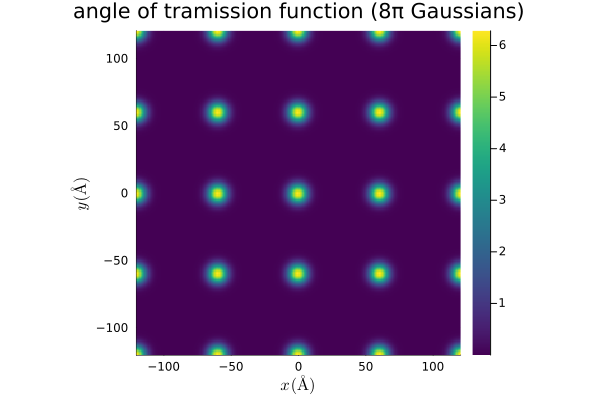

In [59]:
S = 5
σ₊, σ₋ = 5, 5
phase_real = zeros(N, N)
phase_complex = zeros(N, N)
indices = round.(Int, LinRange(1, N, S))
# for i in indices, j in indices
#     phase[j, i] += 1
# end
for i in indices, j in indices
    xc = x[i]
    yc = y[j]
    phase_real += f(x',y, xc, yc, σ₊, σ₋)
    phase_complex += f(x',y, xc, yc, σ₊, σ₋) 
end


phase_real = phase_real./maximum(phase_real) *2*π
phase_complex = phase_complex./maximum(phase_complex) * 0.1
phase = phase_real + 1im*phase_complex

Ψₜ = @. exp(1im*phase)
heatmap(x,y,abs.(phase), aspect_ratio=1, c=:viridis, colorbar=true, axis=true)
xlabel!(L"x\, (Å)")
ylabel!(L"y\, (Å)")
xlims!(-L/2, L/2)
ylims!(-L/2, L/2)
title!("angle of tramission function (8π Gaussians)")

In [214]:
# Define the incident angle (θ) in radians and wave vector magnitude (k0)
θ = deg2rad(90)      # incident angle (radians)
ϕ = deg2rad(0) # azimuthal angle (radians)

# Wavevector components; here we tilt the plane wave along x-direction
kmag = 2 * pi / Wavelength(300)


# Create the plane wave by computing the phase exp(i*(kx*x + ky*y))
ref_wave = @. exp(1im * kmag * (sin(θ)*cos(ϕ)*x' + sin(θ)*sin(ϕ)*y))

# Plot the amplitude
# heatmap(abs.(ref_wave), aspect_ratio=1, c=:viridis, colorbar=true, axis=true)
heatmap(x,y,angle.(ref_wave), aspect_ratio=1, c=:viridis, colorbar=true, axis=true);

\begin{align}
    \psi_{ref}(x) &= A e^{i\vec{k} \cdot \vec{r}}\\
    &= A e^{i|k| \hat{k} \cdot \vec{r} }\\
    &= A e^{i|k|(\sin(\theta)\hat{y},cos(\theta)\hat{z}) \cdot (x,y) }
\end{align}

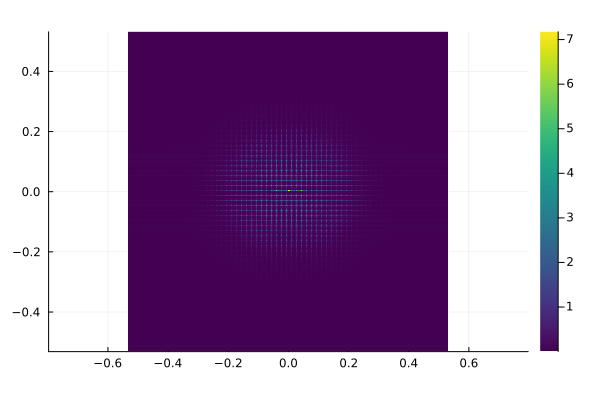

In [215]:
Ψₜ = @. exp(1im*phase)

ideal_measured = abs2.(Ψₜ .+ ref_wave )
ideal_fft = fftnshift(ideal_measured)
heatmap(kx,ky,Diff_Image(ideal_fft,0.01), aspect_ratio=1, c=:viridis, colorbar=true, axis=true)

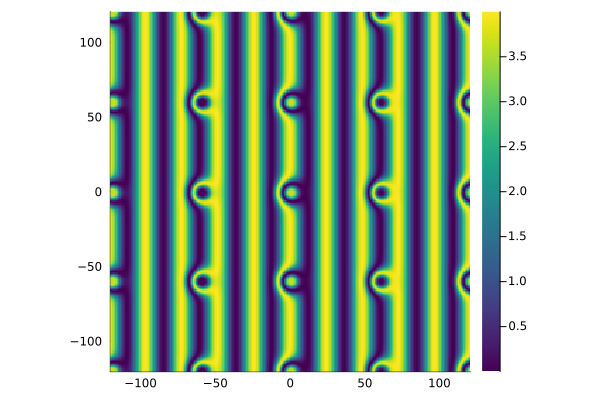

In [216]:
heatmap(x,y, ideal_measured, aspect_ratio=1, c=:viridis, 
    colorbar=true, axis=true)
    xlims!(-L/2, L/2)
    ylims!(-L/2, L/2)

In [63]:
using ImageFiltering
using Unwrap

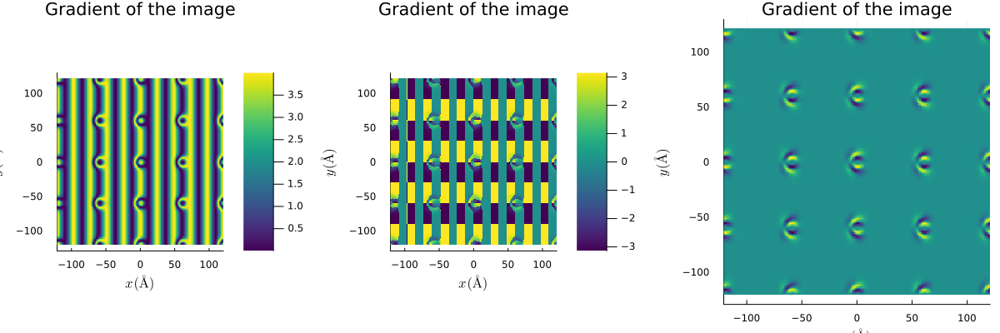

In [217]:
ideal_unwrapped = unwrap(ideal_measured)
Gy, Gx = imgradients(ideal_unwrapped, KernelFactors.sobel, "symmetric")
G_dirc = atan.(Gy, Gx)
G_mag = sqrt.(Gx.^2 .+ Gy.^2)
fig1 = heatmap(x,y, ideal_unwrapped, aspect_ratio=1, c=:viridis, colorbar=true, axis=true)
fig2 = heatmap(x,y, G_dirc, aspect_ratio=1, c=:viridis, colorbar=true, axis=true)
fig3 = heatmap(x,y, Gy, aspect_ratio=1, c=:viridis, colorbar=false, axis=true)
plot(fig1, fig2, fig3, layout=(1,3), size=(1200, 400), 
    xlabel=L"x\, (Å)", ylabel=L"y\, (Å)", title="Gradient of the image")

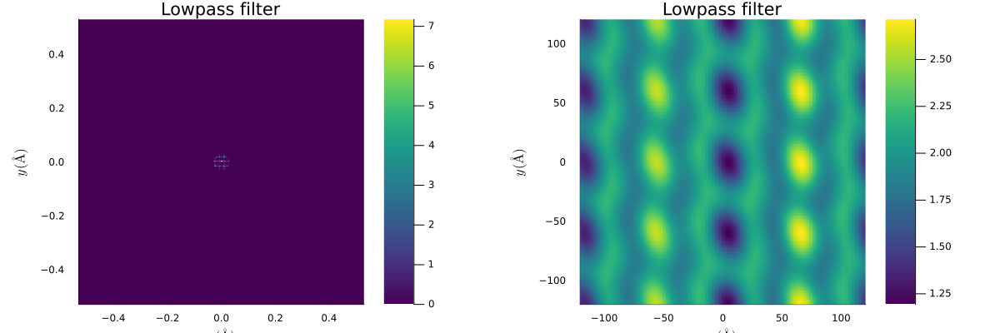

In [218]:
shifts = 22
shifts = 0
x_disk = (lower:1:upper) .- shifts
y_disk = (lower:1:upper) .- shifts

r_disk = @. sqrt(x_disk'^2 + y_disk^2)
fft_smalldisk = r_disk.>=N/2
fft_disk = r_disk.<= 14/2
ideal_unwrapped_lowpass = fftnshift(ideal_measured).*fft_disk
ideal_unwrapped_lowpass_real = abs.(ifftnshift(fftnshift(ideal_measured).*fft_disk))
fig1 = heatmap(kx,ky, Diff_Image(ideal_unwrapped_lowpass,0.01), aspect_ratio=1, c=:viridis, colorbar=true, axis=true)
xlims!(kx[1], kx[end])
ylims!(ky[1], ky[end])

fig2 = heatmap(x,y,ideal_unwrapped_lowpass_real, aspect_ratio=1, c=:viridis, colorbar=true, axis=true)
xlims!(x[1], x[end])
ylims!(y[1], y[end])
plot(fig1, fig2, layout=(1,2), size=(1200, 400), 
    xlabel=L"x\, (Å)", ylabel=L"y\, (Å)", title="Lowpass filter")

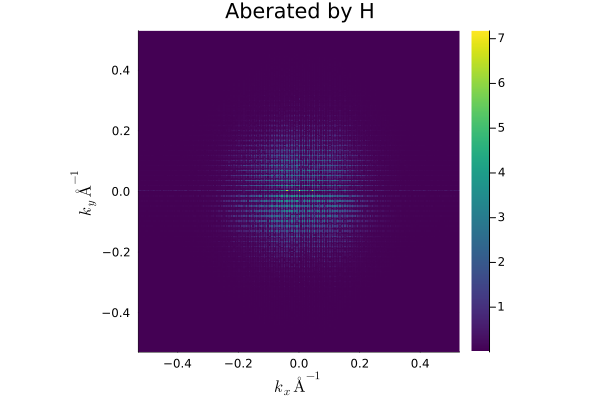

In [219]:
physical = TEM_Image(Ψₜ, E, Cs)
physical_ref = TEM_Image(ref_wave, E, Cs)
physical_measured = @. abs2( physical + physical_ref)
physical_fft = fftnshift(physical_measured)

heatmap(kx,ky,Diff_Image(physical_fft,0.01), 
    aspect_ratio=1, 
    c=:viridis, 
    colorbar=:true, 
    axis=true,
    xlabel=L"k_x\, Å^{-1}",
    ylabel=L"k_y\, Å^{-1}",
    title="Aberated by H")
xlims!(kx[1], kx[end])
ylims!(ky[1], ky[end])

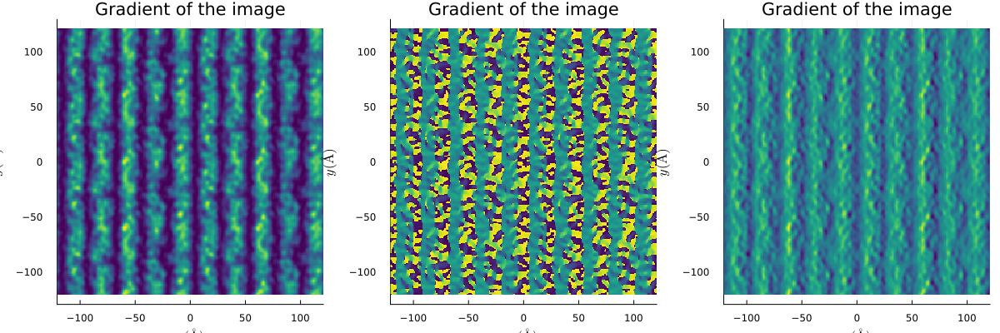

In [220]:
Gy, Gx = imgradients(physical_measured, KernelFactors.sobel, "symmetric")
G_dirc = atan.(Gy, Gx)
G_mag = sqrt.(Gx.^2 + Gy.^2)

fig1 = heatmap(x,y, physical_measured, aspect_ratio=1, c=:viridis, colorbar=false, axis=true)
fig2 = heatmap(x,y, G_dirc, aspect_ratio=1, c=:viridis, colorbar=false, axis=true)
fig3 = heatmap(x,y, Gx, aspect_ratio=1, c=:viridis, colorbar=false, axis=true)
plot(fig1, fig2, fig3, layout=(1,3), size=(1200, 400), 
    xlabel=L"x\, (Å)", ylabel=L"y\, (Å)", title="Gradient of the image")

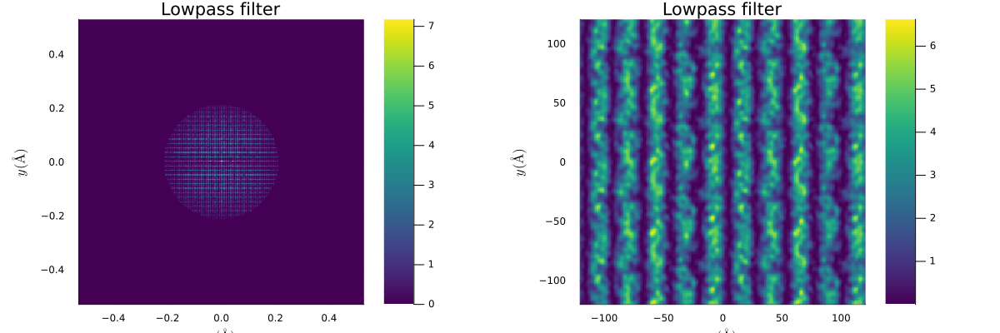

In [221]:
physical_unwrapped = unwrap(physical_measured)
fft_smalldisk = r_disk.>=N/2
fft_disk = r_disk.<=N/5
physical_unwrapped_lowpass = fftnshift(physical_measured).*fft_disk
physical_unwrapped_lowpass_real = abs.(ifftnshift(fftnshift(physical_unwrapped).*fft_disk))
fig1 = heatmap(kx,ky, Diff_Image(physical_unwrapped_lowpass,0.01), aspect_ratio=1, c=:viridis, colorbar=true, axis=true)
xlims!(kx[1], kx[end])
ylims!(ky[1], ky[end])

fig2 = heatmap(x,y,physical_unwrapped_lowpass_real, aspect_ratio=1, c=:viridis, colorbar=true, axis=true)
xlims!(x[1], x[end])
ylims!(y[1], y[end])
plot(fig1, fig2, layout=(1,2), size=(1200, 400), 
    xlabel=L"x\, (Å)", ylabel=L"y\, (Å)", title="Lowpass filter")

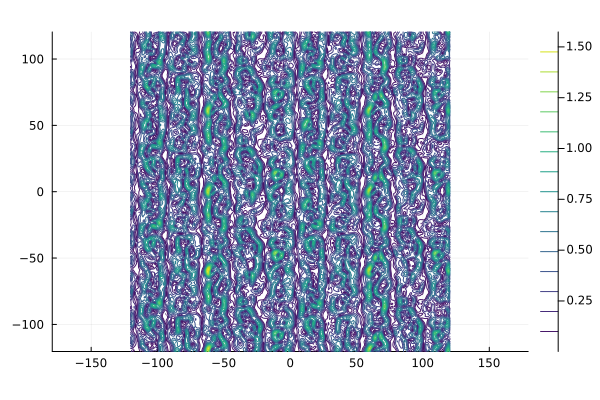

In [222]:
# Convert polar to Cartesian components
U = G_mag .* cos.(G_dirc)
V = G_mag .* sin.(G_dirc)
xx = repeat(x', length(y), 1)
yy = repeat(y, 1, length(x))
# Create a quiver plot of the vector grid.
contour(x,y, G_mag, aspect_ratio=1, c=:viridis, colorbar=true, axis=true)



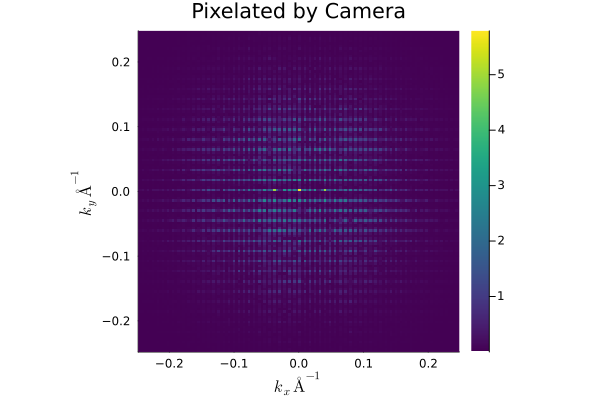

In [223]:
physical_fft_pixelated_in_kspace,kx_camera,ky_camera = Pixelate_Reciprocal(physical_fft, camera_scale, physical_scale)
physical_pixelated = abs.(ifftnshift(physical_fft_pixelated_in_kspace))


heatmap(kx_camera,ky_camera,Diff_Image(physical_fft_pixelated_in_kspace,0.01), 
    aspect_ratio=1, 
    c=:viridis, 
    colorbar=:true, 
    axis=true,
    xlabel=L"k_x\, Å^{-1}",
    ylabel=L"k_y\, Å^{-1}",
    title="Pixelated by Camera")
xlims!(kx_camera[1], kx_camera[end])
ylims!(ky_camera[1], ky_camera[end])

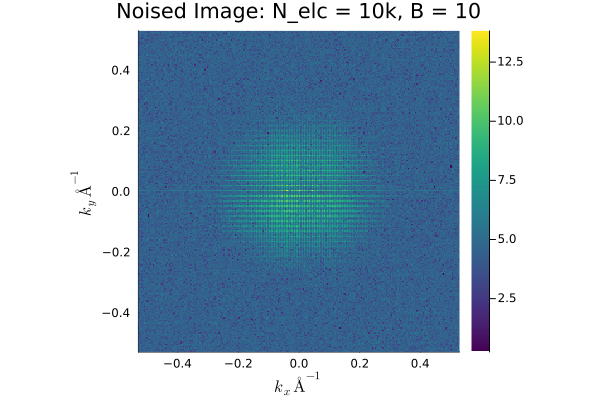

In [224]:
N_electrons = 1e8
B = 10
physical_measured_noised = Noisy_Image(physical_measured, N_electrons, B)
physical_fft_noised = fftnshift(physical_measured_noised)

heatmap(kx, ky, Diff_Image(physical_fft_noised, 0.01), 
    aspect_ratio=1, 
    c=:viridis, 
    colorbar=:true, 
    axis=true,
    xlabel=L"k_x\, Å^{-1}",
    ylabel=L"k_y\, Å^{-1}",
    title="Noised Image: N_elc = 10k, B = $B")
xlims!(kx[1], kx[end])
ylims!(ky[1], ky[end])

In [225]:
function Autocorrelation(image)
    # the image is assumed to be in real space
    
    image_fft = fftnshift(image)
    image_auto = ifftnshift(image_fft .* conj.(image_fft))
    if eltype(image) <: Real 
        return real.(image_auto)
    end
    return image_auto
end

Autocorrelation (generic function with 1 method)

In [201]:
function Normalized_Autocorrelation(image)
    # the image is assumed to be in real space
    Ny, Nx = size(image)
    image_auto = Autocorrelation(image)
    image_auto = image_auto./(Ny*Nx)
    image_auto = image_auto .- mean(image_auto)
    image_auto = image_auto ./ maximum(image_auto)
    return image_auto
end

Normalized_Autocorrelation (generic function with 1 method)

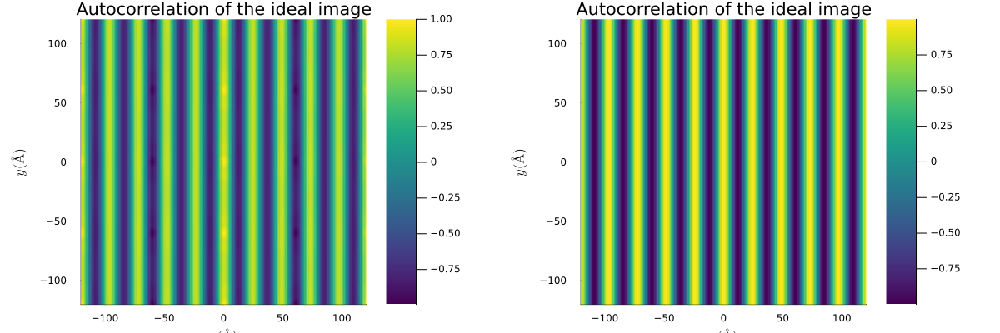

In [226]:
# ideal_autocorr = Autocorrelation(ideal_measured)./N^2
# ideal_autocorr = ideal_autocorr .- mean(ideal_autocorr)
# ideal_autocorr = ideal_autocorr ./ maximum(ideal_autocorr)
ideal_autocorr = Normalized_Autocorrelation(ideal_measured)

# ideal_autocorr = ideal_autocorr./maximum(ideal_autocorr)
# physical_autocorr = Autocorrelation(physical_measured)./N^2
# physical_autocorr = physical_autocorr .- mean(physical_autocorr)
# physical_autocorr = physical_autocorr ./ maximum(physical_autocorr)
physical_autocorr = Normalized_Autocorrelation(physical_measured)
# noisy_autocorr = Autocorrelation(physical_measured_noised)
noisy_autocorr = Normalized_Autocorrelation(physical_measured_noised)
pixelated_autocorr = Normalized_Autocorrelation(physical_pixelated)

mask = ideal_autocorr .< maximum(ideal_autocorr).*0.5 
# println(maximum(imag.(ideal_autocorr))
fig1 = heatmap(x,y, ideal_autocorr, 
    aspect_ratio=1, 
    c=:viridis, 
    colorbar=:true, 
    axis=true,
    xlabel=L"x\, (Å)",
    ylabel=L"y\, (Å)",
    title="Autocorrelation of the ideal image")
    xlims!(-L/2, L/2)
    ylims!(-L/2, L/2)
fig2 = heatmap(x,y, cos.(angle.(ref_wave)), 
    aspect_ratio=1, 
    c=:viridis, 
    colorbar=:true, 
    axis=true,
    xlabel=L"x\, (Å)",
    ylabel=L"y\, (Å)",
    title="Autocorrelation of the physical image")
    xlims!(-L/2, L/2)
    ylims!(-L/2, L/2)
plot(fig1, fig2, layout=(1,2), size=(1200, 400), 
    xlabel=L"x\, (Å)", ylabel=L"y\, (Å)", title="Autocorrelation of the ideal image")


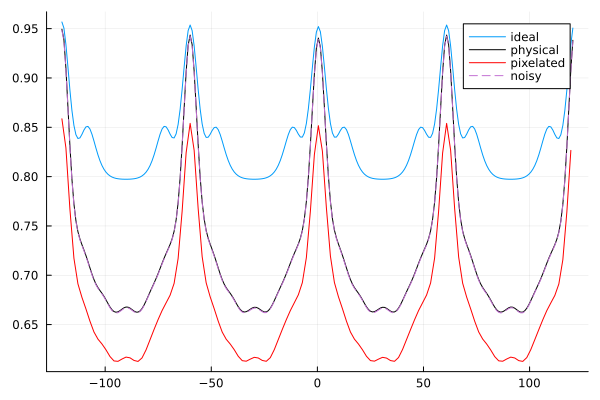

In [227]:
plot(x, ideal_autocorr[:,N÷2], label="ideal")
plot!(x, physical_autocorr[:,N÷2], label="physical", color=:black)
plot!(x[1:camera_scale÷physical_scale:end], pixelated_autocorr[:,N÷2], label="pixelated", color=:red)
plot!(x, noisy_autocorr[:,N÷2], label="noisy", linestyle=:dash)

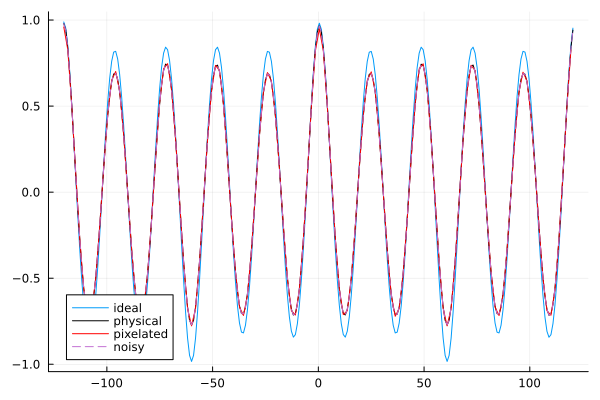

In [228]:
plot(x, ideal_autocorr[N÷2,:], label="ideal")
plot!(x, physical_autocorr[N÷2,:], label="physical", color=:black)
plot!(x[1:camera_scale÷physical_scale:end], pixelated_autocorr[N÷2,:], label="pixelated", color=:red)
plot!(x, noisy_autocorr[N÷2,:], label="noisy", linestyle=:dash)

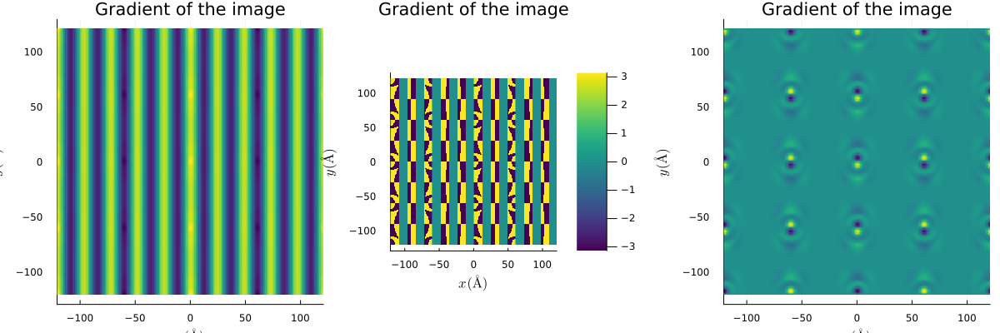

In [229]:
Gy, Gx = imgradients(ideal_autocorr, KernelFactors.sobel, "symmetric")
G_dirc = atan.(Gy, Gx)
G_mag = sqrt.(Gx.^2 + Gy.^2)

fig1 = heatmap(x,y, ideal_autocorr, aspect_ratio=1, c=:viridis, colorbar=false, axis=true)
fig2 = heatmap(x,y, G_dirc, aspect_ratio=1, c=:viridis, colorbar=true, axis=true)
fig3 = heatmap(x,y, Gy, aspect_ratio=1, c=:viridis, colorbar=false, axis=true)
plot(fig1, fig2, fig3, layout=(1,3), size=(1200, 400), 
    xlabel=L"x\, (Å)", ylabel=L"y\, (Å)", title="Gradient of the image")

In [195]:

function reference_model(A, C, θ_polar,ϕ_azi)
    return @. A*cos(2π/Wavelength(E) * sin(θ_polar)*(cos(ϕ_azi)*x' + sin(ϕ_azi)*y)) + C
end

model_ref = Model(Ipopt.Optimizer)
@variable(model_ref, A_const, start=maximum(ideal_autocorr))
@variable(model_ref, C_const)
# @variable(model_ref, θ_polar, lower_bound=0, upper_bound=π, start=θ)
# @variable(model_ref, ϕ_azi, lower_bound=0, upper_bound=2π, start = ϕ)
@variable(model_ref, θ_polar, lower_bound=0, upper_bound=π/2)
@variable(model_ref, ϕ_azi, lower_bound=0, upper_bound=2π)

ref_term = @expression(model_ref, reference_model(A_const, θ_polar, ϕ_azi)) 


# costb = @expression(model, smooth_penalty(b))


@objective(model_ref, Min,
    sum((ref_term .- ideal_autocorr).^2))


set_optimizer_attribute(model_ref, "print_level", 5)
optimize!(model_ref)

This is Ipopt version 3.14.17, running with linear solver MUMPS 5.7.3.

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:        0
Number of nonzeros in Lagrangian Hessian.............:        6

Total number of variables............................:        4
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        2
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:        0
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  4.9940160e+04 0.00e+00 1.08e+06  -1.0 0.00e+00    -  0.00e+00 0.00e+00 

InterruptException: InterruptException:

In [72]:
using JuMP
using Ipopt

In [184]:
println(value(θ_polar), " ", value(ϕ_azi), " ", value(A_const), " ", value(C_const))
println("should get ", θ, " ", ϕ)

1.5707963268208955 0.7853981633974484 1.0000152661383224 0.0
should get 1.5707963267948966 0.7853981633974483


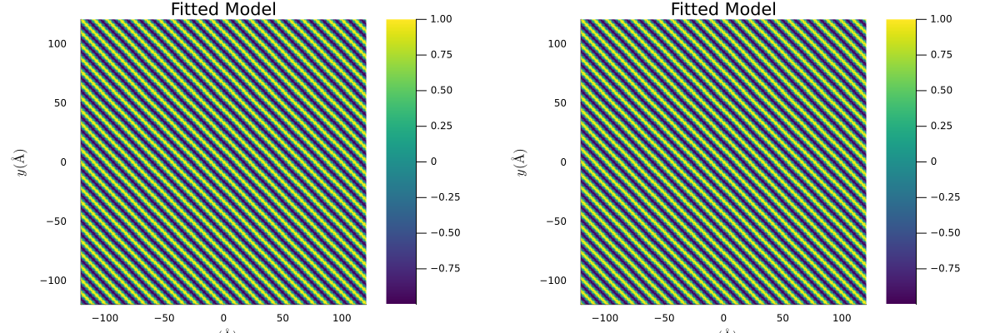

In [185]:
model_fitting = reference_model(value(A_const), value(θ_polar), value(ϕ_azi))
# model_fitting = reference_model(1, θ, ϕ)

fig1 = heatmap(x,y, model_fitting, 
    aspect_ratio=1, 
    c=:viridis, 
    colorbar=:true, 
    axis=true,
    xlabel=L"x\, (Å)",
    ylabel=L"y\, (Å)",
    title="Fitted Model")
    xlims!(-L/2, L/2)
    ylims!(-L/2, L/2)
model_fitting = reference_model(1,0, θ, ϕ)
fig2 = heatmap(x,y, model_fitting, 
    aspect_ratio=1, 
    c=:viridis, 
    colorbar=:true, 
    axis=true,
    xlabel=L"x\, (Å)",
    ylabel=L"y\, (Å)",
    title="Fitted Model")
xlims!(-L/2, L/2)
ylims!(-L/2, L/2)
plot(fig1, fig2, layout=(1,2), size=(1200, 400), 
    xlabel=L"x\, (Å)", ylabel=L"y\, (Å)", title="Fitted Model")

In [73]:
# N = 2^7
# amk = Array{Any}(undef, N)
# z::Vector{Float64} = LinRange(0, 10, N)
# m = 20
# b = 0.4
# # x = 0:0.1:10
# noise = randn(length(z))
# y = @. sin(m*z) + b 
# y_fft = abs.(fftshift(fft(y)))




# plot(z, y, label="data")
# plot!(z, y_fft, label="fft")

In [74]:
# struct MinimizingFunc
#     x::Vector{Float64}
#     y::Vector{Float64}
#     kmag::Float64
#     y_data::Vector{Float64}
#     # amk::Array{Any, 3}
#     # params::Vector{Float64}
# end
# function (pv::MinimizingFunc)(m, b)

   
#     model_real = @. sin(m*pv.x) + b
#     model_imag = model_real.*zero(model_real)


    

#     fft_1dgpt!(model_real, model_imag)
#     # model_abs = @. sqrt(model_real^2 + model_imag^2)
#     # half_real = model_fft[1:2:end]

    
#     obj = sum((model_real .- pv.y_data).^2)

#     return obj
# end

In [75]:
# model = Model(Ipopt.Optimizer)
# set_silent(model)
# ConstraintFunc = MinimizingFunc(z, y_fft)

# q = @variable(model, start=m)
# p = @variable(model, start=b)
# @variable(model, x[1:3, 1:2])
# @variable(model, y[1:3, 1:2])
# @variable(model, ams[1:3, 1:2])

# # ams = @expression(model, ConstraintFunc(φ))

# # @constraint(model, ams[1] == ams[2])


# @objective(model, Min, ConstraintFunc(q,p))
# optimize!(model)

In [76]:
q_sol = value(q)
p_sol = value(p)
println("Solution:")
println("q = ", q_sol)
println("p = ", p_sol)
model_fit = @. sin(q_sol*z) + .1
model_fit_fft = abs.(fftshift(fft(model_fit)))
plot(z, model_fit_fft, label="model fit", linestyle=:dash)
plot!(z, y_fft, label="fft")


UndefVarError: UndefVarError: `q` not defined in `Main`
Suggestion: check for spelling errors or missing imports.

In [77]:
using ForwardDiff

In [ ]:
using JuMP, Ipopt, ForwardDiff

Nx, Ny = size(ideal_measured)          # detector grid
λi, λr = 1e-2, 1e-2
# λi, λr, λb = 0, 0, 0

model = Model(Ipopt.Optimizer)
# @variable(model, φi[1:Nx,1:Ny], start = phase_real)
# @variable(model, φr[i=1:Nx, j=1:Ny], start = phase_real[i,j])
@variable(model, φr[i=1:Nx, j=1:Ny], lower_bound=0)
# @variable(model, φr[1:Nx,1:Ny], start = phase_complex)
# @variable(model, φi[i=1:Nx, j=1:Ny], start = phase_complex[i,j],
#          lower_bound=-0.1, upper_bound=0.10)
@variable(model, φi[i=1:Nx, j=1:Ny],
         lower_bound=-0.1, upper_bound=0.10)
# @variable(model,  b[1:Nx,1:Ny])
@variable(model, θ_polar, lower_bound=0, upper_bound=π, start=0)
@variable(model, ϕ_azi, lower_bound=0, upper_bound=2π, start = 0)
# @variable(model, λi_model, lower_bound=0)
# @variable(model, λr_model, lower_bound=0)

function reference_term(θ_polar,ϕ_azi)
    return @. 2π/Wavelength(E) * sin(θ_polar)*(cos(ϕ_azi)*x' + sin(ϕ_azi)*y)
end


function ll_term(φi, φr, θ_polar, ϕ_azi)
    ref_wave = @. reference_term(θ_polar,ϕ_azi)
    Î = @. exp(-2φi) + 1 + 2*exp(-φi)*cos(φr - ref_wave) 
    return -0.5* sum((Î - ideal_measured).^2)
end

function smooth_penalty(φ)
    return sum(@. (φ[2:end,:] - φ[1:end-1,:])^2) +
           sum(@. (φ[:,2:end] - φ[:,1:end-1])^2)
end



llterm = @expression(model, ll_term(φi, φr, θ_polar, ϕ_azi)) 
costϕi = @expression(model, smooth_penalty(φi))
costϕr = @expression(model, smooth_penalty(φr))

# costb = @expression(model, smooth_penalty(b))


@NLobjective(model, Max,
    llterm 
   - λi*costϕi
   - λr*costϕr)


set_optimizer_attribute(model, "print_level", 5)
optimize!(model)


This is Ipopt version 3.14.17, running with linear solver MUMPS 5.7.3.

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:        0
Number of nonzeros in Lagrangian Hessian.............:   719875

Total number of variables............................:   131074
                     variables with only lower bounds:    65536
                variables with lower and upper bounds:    65538
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:        0
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0 -1.3011976e+05 0.00e+00 2.78e+06  -1.0 0.00e+00    -  0.00e+00 0.00e+00 

InterruptException: InterruptException:

In [79]:
println("Objective value: ", objective_value(model))
println("φi: ", value.(φi))

┌ Warning: The model has been modified since the last call to `optimize!` (or `optimize!` has not been called yet). If you are iteratively querying solution information and modifying a model, query all the results first, then modify the model.
└ @ JuMP /home/nicolas/.julia/packages/JuMP/CU7H5/src/optimizer_interface.jl:1065


OptimizeNotCalled: OptimizeNotCalled()

In [80]:
phase_r = value.(φr)
phase_i = value.(φi)
θ_infered = value(θ_polar)
ϕ_infered = value(ϕ_azi)

phase_reconstruced = @. phase_r + 1im*phase_i
heatmap(x,y,phase_r, aspect_ratio=1, c=:viridis, colorbar=true, axis=true)
xlims!(-L/2, L/2)
ylims!(-L/2, L/2)

┌ Warning: The model has been modified since the last call to `optimize!` (or `optimize!` has not been called yet). If you are iteratively querying solution information and modifying a model, query all the results first, then modify the model.
└ @ JuMP /home/nicolas/.julia/packages/JuMP/CU7H5/src/optimizer_interface.jl:1085


OptimizeNotCalled: OptimizeNotCalled()

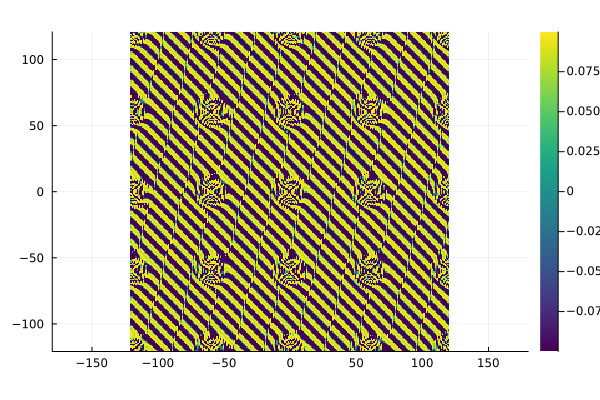

In [81]:
heatmap(x,y, phase_i, aspect_ratio=1, c=:viridis, colorbar=true, axis=true)

In [82]:
println("θ_infered: ", θ_infered)
println("ϕ_infered: ", ϕ_infered)

θ_infered: 0.01000026241768323
ϕ_infered: 0.011298417891817403


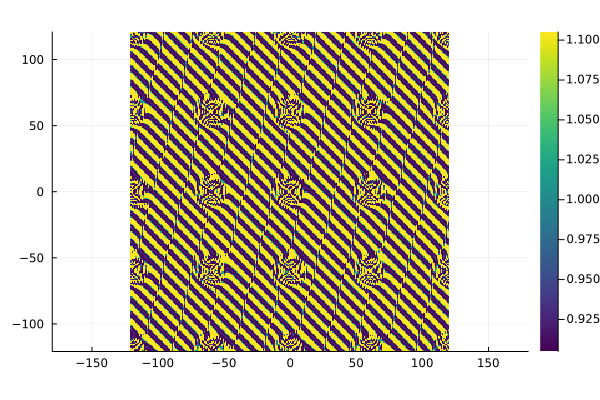

In [83]:
ψ_reconstruced = @. exp(1im*phase_reconstruced)
heatmap(x,y, abs.(ψ_reconstruced), aspect_ratio=1, c=:viridis, colorbar=true, axis=true)